In [1]:
import os
import cv2
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image
from skimage.feature import local_binary_pattern
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc

from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

import joblib
import pywt
from scipy.stats import linregress

import platform
import psutil
import subprocess

In [2]:
USE_FULL_DATA = False
TRAIN_SIZE = 1000
VAL_RATIO = 0.2
TEST_RATIO = 0.2

BASE_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake"
TRAIN_PATH = os.path.join(BASE_PATH, "train")

SCALE_FACTOR = 1.0

In [3]:
def extract_prnu(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    coeffs = pywt.dwt2(gray, 'db2')
    cA, (cH, cV, cD) = coeffs
    noise = np.sqrt(np.abs(cH * cV * cD))
    return [np.mean(noise), np.std(noise)]
    
def extract_dct(image, scale=SCALE_FACTOR):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    dct = cv2.dct(np.float32(gray))

    dct_abs = np.log1p(np.abs(dct))

    h, w = dct_abs.shape

    low = np.mean(dct_abs[:h//4, :w//4])
    mid = np.mean(dct_abs[h//4:h//2, w//4:w//2])
    high = np.mean(dct_abs[h//2:, w//2:])

    dct_std = np.std(dct_abs)

    return [
        low * scale,
        mid * scale,
        high * scale,
        dct_std * scale
    ]

def extract_lbp(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    features = []

    for radius in [1, 2, 3]:
        lbp = local_binary_pattern(gray, P=8 * radius, R=radius, method='uniform')
        hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 59), range=(0, 58))
        hist = hist / (np.sum(hist) + 1e-8)
        features.extend(hist.tolist())

    return features

def extract_fft(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 1️⃣ FFT + shift
    fft = np.fft.fft2(gray)
    fft_shift = np.fft.fftshift(fft)

    # 2️⃣ Normalized log magnitude (ổn định hơn nhiều)
    mag = np.log1p(np.abs(fft_shift) / (gray.shape[0] * gray.shape[1]))

    h, w = mag.shape
    cy, cx = h // 2, w // 2

    # 3️⃣ Radial distance map
    Y, X = np.ogrid[:h, :w]
    r = np.sqrt((X - cx) ** 2 + (Y - cy) ** 2)

    r_norm = r / r.max()  # normalize 0 → 1

    # Frequency bands based on radius
    low_mask  = (r_norm <= 0.15)
    mid_mask  = (r_norm > 0.15) & (r_norm <= 0.40)
    high_mask = (r_norm > 0.40)

    # 4️⃣ Extract band energies
    fft_low  = mag[low_mask].mean()
    fft_mid  = mag[mid_mask].mean()
    fft_high = mag[high_mask].mean()

    # 5️⃣ Standard deviation (texture richness)
    fft_std = np.std(mag)

    # 6️⃣ High-frequency ratio (GAN thường thấp hơn)
    hf_ratio = fft_high / (fft_low + 1e-8)

    # 7️⃣ Radial spectral decay (signature GAN)
    # Compute radial profile
    radial_bins = np.linspace(0, r_norm.max(), 50)
    radial_energy = []

    for i in range(len(radial_bins) - 1):
        mask = (r_norm >= radial_bins[i]) & (r_norm < radial_bins[i+1])
        if np.any(mask):
            radial_energy.append(mag[mask].mean())
        else:
            radial_energy.append(0)

    radial_energy = np.array(radial_energy) + 1e-8

    # Fit slope in log domain
    slope, _, _, _, _ = linregress(np.arange(len(radial_energy)), np.log(radial_energy))
    spectral_slope = slope

    return [fft_low, fft_mid, fft_high, fft_std, hf_ratio, spectral_slope]

def extract_features(image_path):
    try:
        image = cv2.imread(image_path)
        if image is None:
            return None

        # prnu_mean, prnu_std = extract_prnu_lukas(image)
        prnu = extract_prnu(image)
        dct = extract_dct(image)
        lbp = extract_lbp(image)
        fft = extract_fft(image)

        return np.hstack([prnu, dct, lbp, fft])

    except Exception as e:
        print("Error:", e)
        return None

In [4]:
def load_dataset(folder, limit_per_class=None):
    X, y, filenames = [], [], []

    for label, subdir in enumerate(["real", "fake"]):
        path = os.path.join(folder, subdir)
        files = os.listdir(path)

        if limit_per_class:
            files = files[:limit_per_class]

        for fname in tqdm(files, desc=f"Extracting {subdir}"):
            fpath = os.path.join(path, fname)
            feat = extract_features(fpath)
            if feat is not None:
                X.append(feat)
                y.append(label)
                filenames.append(fname)   

    return np.array(X), np.array(y), np.array(filenames)


### PRNU

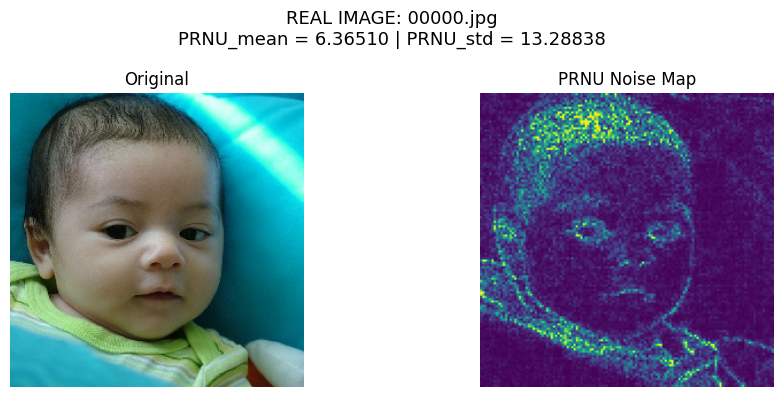

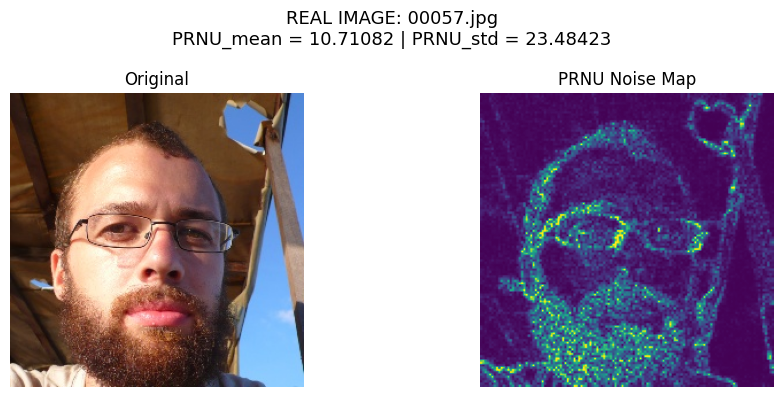

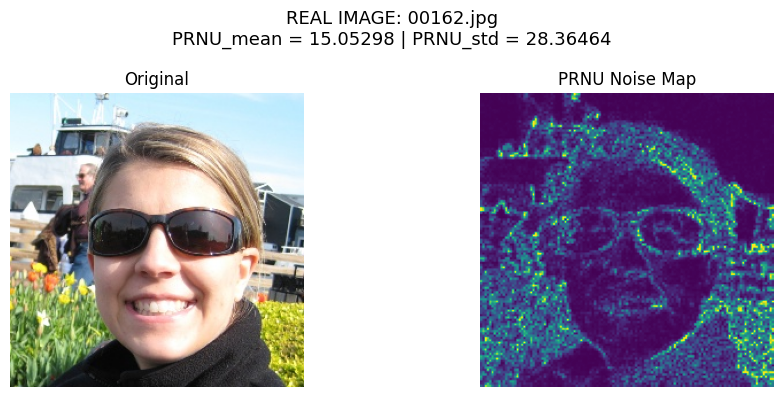

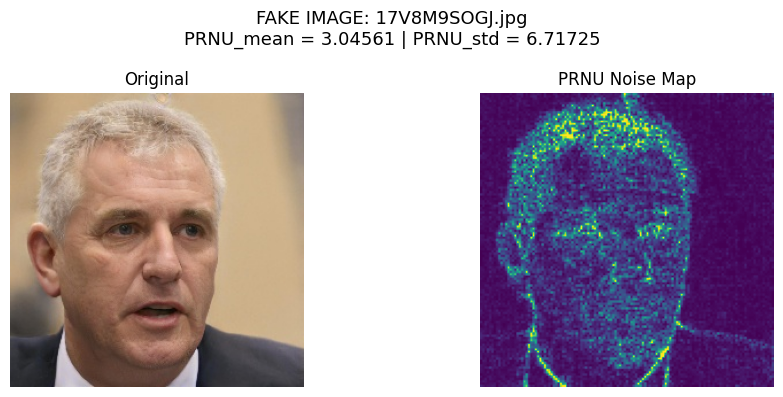

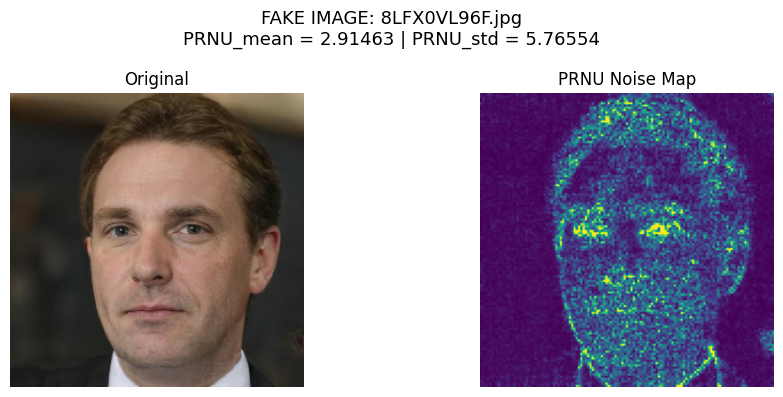

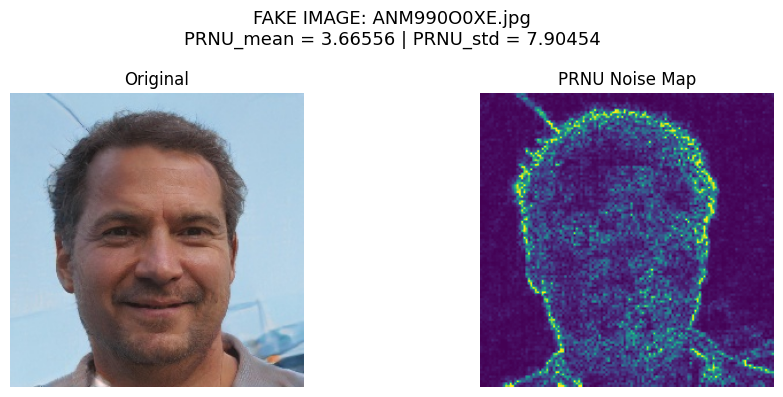

In [5]:
def extract_prnu_noise_map(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Wavelet Decomposition
    cA, (cH, cV, cD) = pywt.dwt2(gray, 'db2')

    # Raw PRNU noise
    noise_map = np.sqrt(np.abs(cH * cV * cD))

    # --- 1. CLIP OUTLIERS  ---
    noise_clip = np.clip(
        noise_map,
        np.percentile(noise_map, 1),
        np.percentile(noise_map, 99)
    )

    # --- 2. NORMALIZE 0 → 1 ---
    noise_norm = (noise_clip - noise_clip.min()) / (noise_clip.max() - noise_clip.min() + 1e-9)

    # --- 3. GAMMA CORRECTION (tăng tương phản PRNU) ---
    gamma = 0.7
    noise_final = np.power(noise_norm, gamma)

    return noise_final

def plot_prnu_for_images(image_list, base_folder, class_type):
    """
    class_type = 'real' hoặc 'fake'
    """
    for fname in image_list:
        img_path = os.path.join(base_folder, class_type, fname)

        img = cv2.imread(img_path)
        if img is None:
            print(f"❌ Cannot load: {img_path}")
            continue

        # Convert BGR → RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # ---- Extract PRNU ----
        prnu_mean, prnu_std = extract_prnu(img)

        # ---- PRNU Noise Map (enhanced) ----
        noise_map = extract_prnu_noise_map(img)

        # ---- Plot  ----
        plt.figure(figsize=(10,4))
        plt.suptitle(
            f"{class_type.upper()} IMAGE: {fname}\n"
            f"PRNU_mean = {prnu_mean:.5f} | PRNU_std = {prnu_std:.5f}",
            fontsize=13
        )

        # Original
        plt.subplot(1,2,1)
        plt.imshow(img_rgb)
        plt.title("Original")
        plt.axis("off")

        # PRNU noise map
        plt.subplot(1,2,2)
        plt.imshow(noise_map, cmap="viridis")
        plt.title("PRNU Noise Map")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

real_list = ["00000.jpg", "00057.jpg", "00162.jpg"]
plot_prnu_for_images(real_list, TRAIN_PATH, "real")

fake_list = ["17V8M9SOGJ.jpg", "8LFX0VL96F.jpg", "ANM990O0XE.jpg"]
plot_prnu_for_images(fake_list, TRAIN_PATH, "fake")

### LBP


================ REAL IMAGES ================


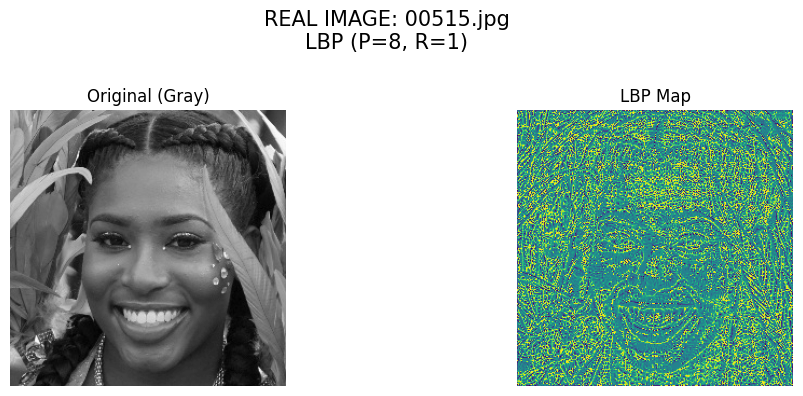

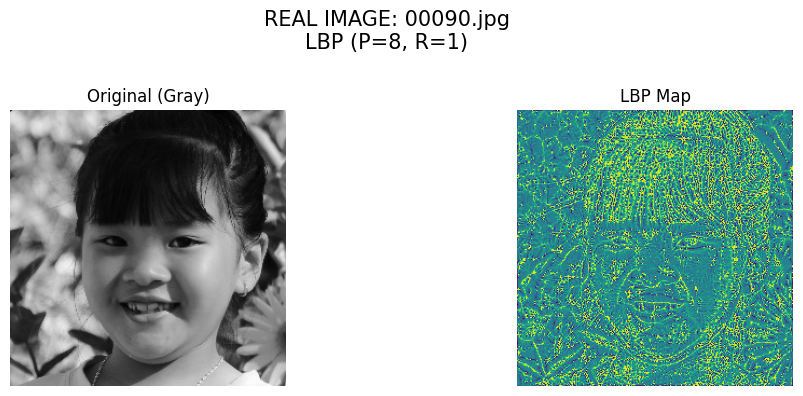

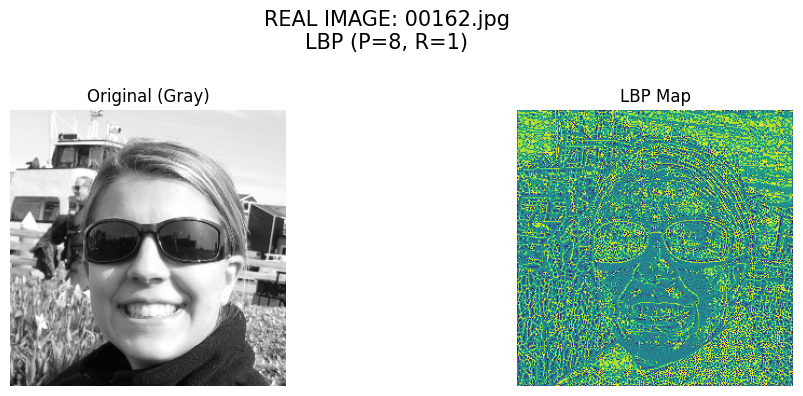


================ FAKE IMAGES ================


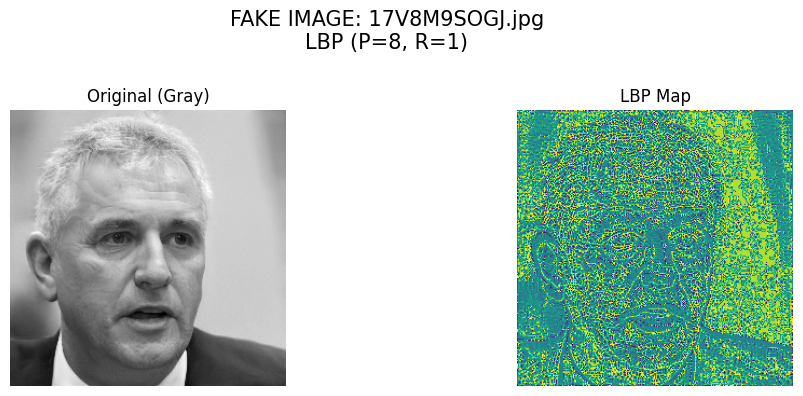

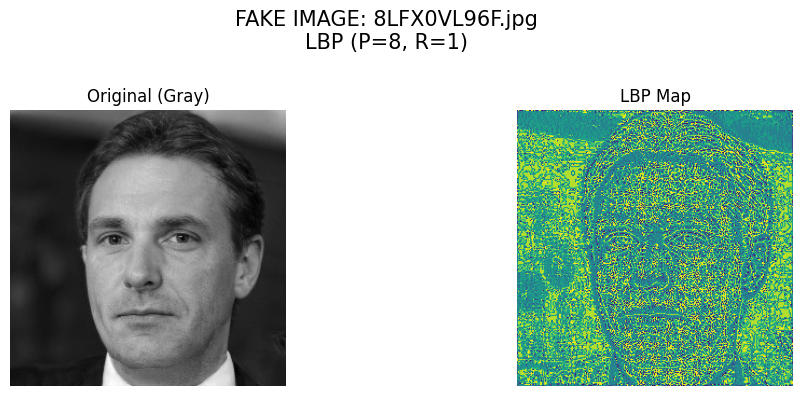

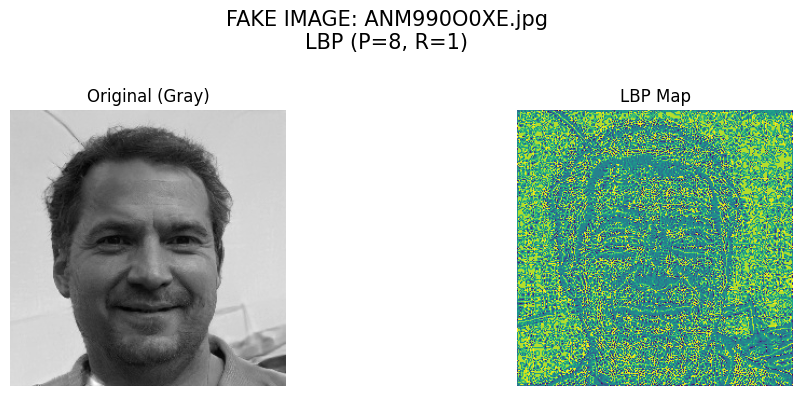

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
import os

LBP_CONFIG = [(8, 1)]


def analyze_lbp_single(image_path, label):
    img = cv2.imread(image_path)
    if img is None:
        print("❌ Cannot load:", image_path)
        return

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    fname = os.path.basename(image_path)
    P, R = LBP_CONFIG[0]

    # Compute LBP
    lbp = local_binary_pattern(gray, P=P, R=R, method="uniform")

    # Create figure WITH CENTERED TITLE
    plt.figure(figsize=(12,4))
    plt.suptitle(
        f"{label.upper()} IMAGE: {fname}\nLBP (P={P}, R={R})",
        fontsize=15,
        x=0.5,
        y=1.05
    )

    # -------- Original --------
    plt.subplot(1,2,1)
    plt.imshow(gray, cmap="gray")
    plt.title("Original (Gray)")
    plt.axis("off")

    # -------- LBP Map --------
    plt.subplot(1,2,2)
    plt.imshow(lbp, cmap="viridis")
    plt.title(f"LBP Map")
    plt.axis("off")

    # Fix layout so suptitle stays centered
    plt.subplots_adjust(top=0.80)

    plt.show()


def analyze_lbp_for_images(base_folder, real_list, fake_list):

    print("\n================ REAL IMAGES ================")
    for fname in real_list:
        path = os.path.join(base_folder, "real", fname)
        analyze_lbp_single(path, "real")

    print("\n================ FAKE IMAGES ================")
    for fname in fake_list:
        path = os.path.join(base_folder, "fake", fname)
        analyze_lbp_single(path, "fake")

BASE = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train"

real_list = ["00515.jpg", "00090.jpg", "00162.jpg"]
fake_list = ["17V8M9SOGJ.jpg", "8LFX0VL96F.jpg", "ANM990O0XE.jpg"]

analyze_lbp_for_images(BASE, real_list, fake_list)


### FFT


===== REAL FFT =====


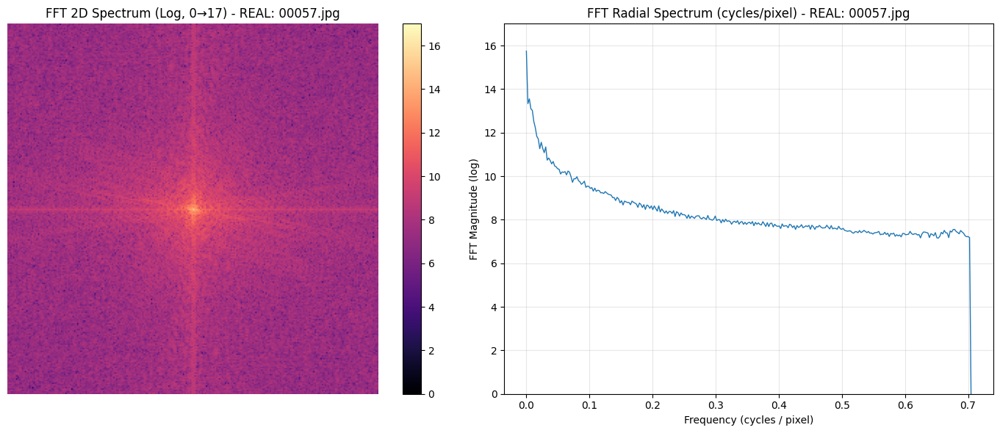

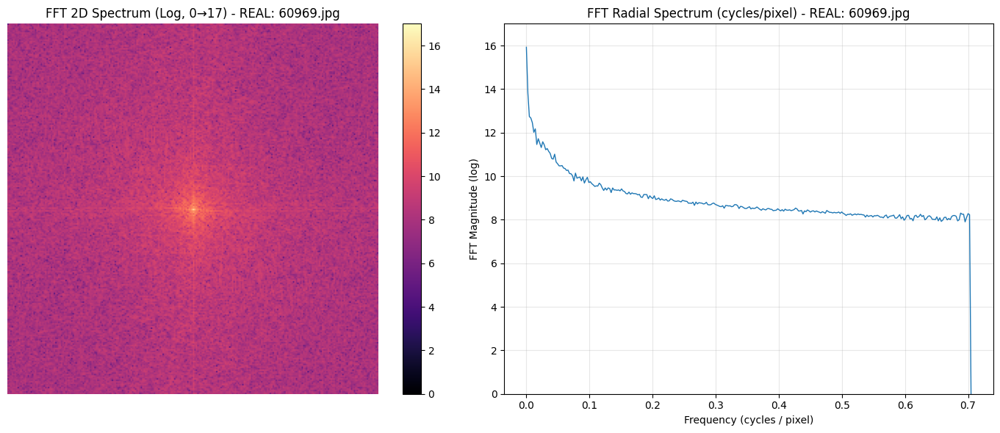

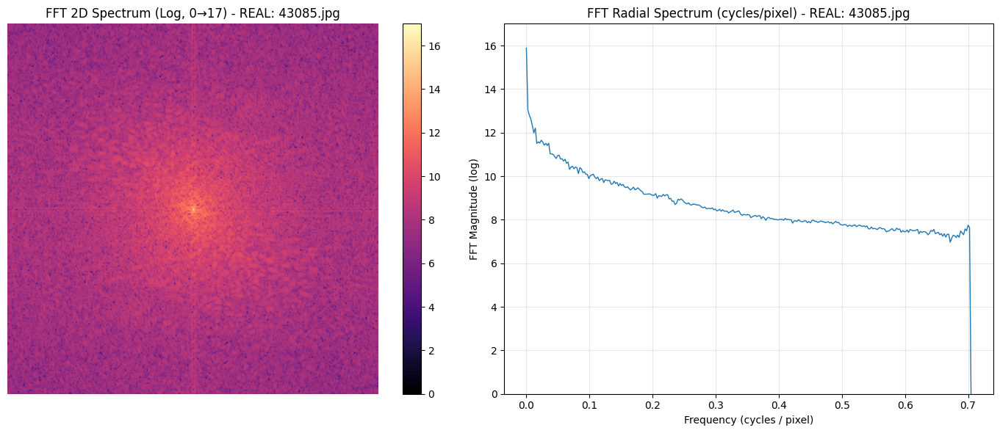


===== FAKE FFT =====


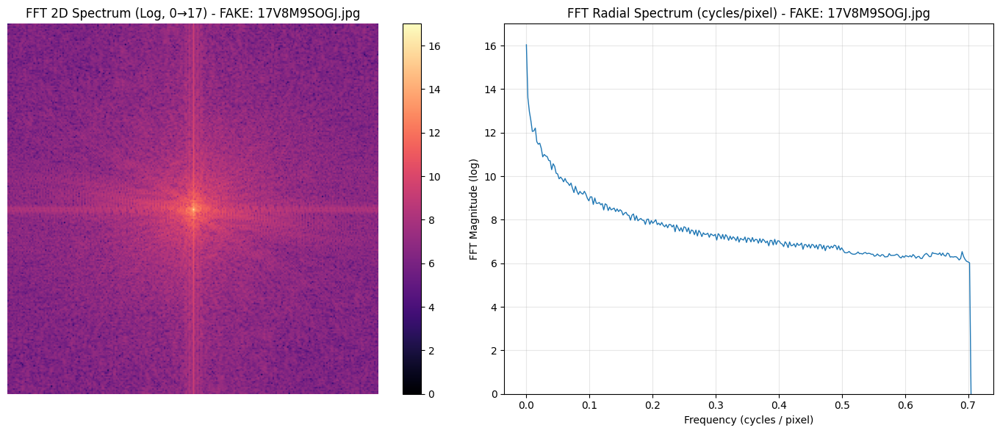

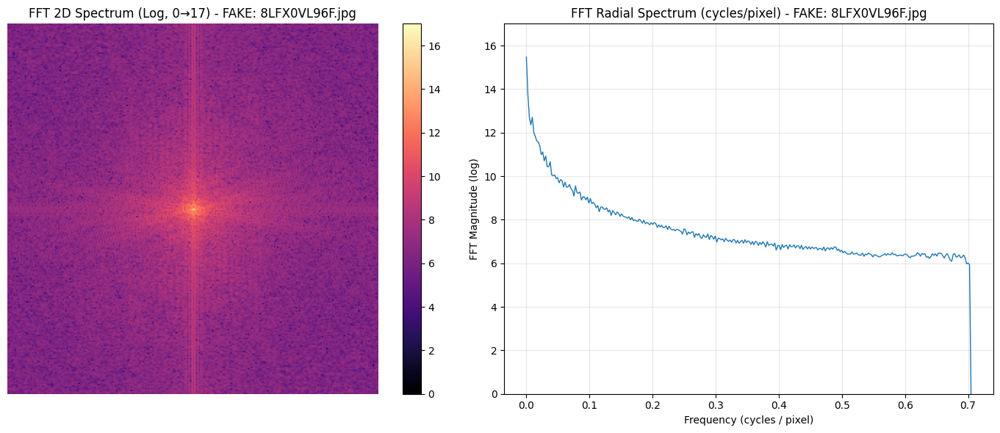

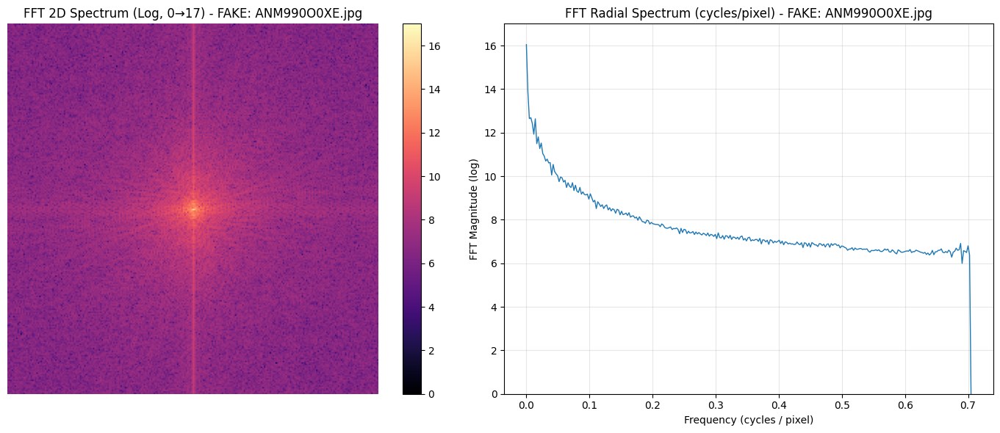

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ================================
# 1. FFT Spectrum (2D Float Heatmap)
# ================================
def fft_spectrum_2d(image, log_scale=True):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32)

    F = np.fft.fft2(gray)
    F_shift = np.fft.fftshift(F)
    mag = np.abs(F_shift)

    if log_scale:
        mag = np.log1p(mag)

    return mag


# ================================
# 2. Radial FFT (Real Frequency: cycles/pixel)
# ================================
def fft_radial_real_frequency(image, num_bins=300):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32)

    H, W = gray.shape

    F = np.fft.fft2(gray)
    F_shift = np.fft.fftshift(F)
    mag = np.abs(F_shift)

    fx = np.fft.fftshift(np.fft.fftfreq(W))
    fy = np.fft.fftshift(np.fft.fftfreq(H))
    FX, FY = np.meshgrid(fx, fy)

    fr = np.sqrt(FX**2 + FY**2)   # cycles/pixel
    fr_max = fr.max()

    bins = np.linspace(0, fr_max, num_bins + 1)
    radial = np.zeros(num_bins)

    for i in range(num_bins):
        mask = (fr >= bins[i]) & (fr < bins[i+1])
        if np.any(mask):
            radial[i] = np.mean(mag[mask])

    return bins[:-1], np.log1p(radial)


# ================================
# 3. Plot Heatmap + Radial Spectrum
# ================================
def plot_fft_all(image_path, title):
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading:", image_path)
        return

    fft2d = fft_spectrum_2d(img)
    freq_axis, signal = fft_radial_real_frequency(img)

    plt.figure(figsize=(14,6))

    # -------- HEATMAP (Log + Fixed Scale 0 → 17) --------
    plt.subplot(1,2,1)
    plt.imshow(fft2d, cmap='magma', vmin=0, vmax=17)
    plt.title(f"FFT 2D Spectrum (Log, 0→17) - {title}")
    plt.colorbar()
    plt.axis("off")

    # -------- RADIAL FFT (cycles/pixel) --------
    plt.subplot(1,2,2)
    plt.plot(freq_axis, signal, lw=1)
    plt.title(f"FFT Radial Spectrum (cycles/pixel) - {title}")
    plt.xlabel("Frequency (cycles / pixel)")
    plt.ylabel("FFT Magnitude (log)")
    plt.grid(alpha=0.3)
    plt.ylim(0, 17) 

    plt.tight_layout()
    plt.show()


# ================================
# 4. RUN for REAL + FAKE
# ================================
BASE = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train"

real_list = ["00057.jpg", "60969.jpg", "43085.jpg"]
fake_list = ["17V8M9SOGJ.jpg", "8LFX0VL96F.jpg", "ANM990O0XE.jpg"]


print("\n===== REAL FFT =====")
for fname in real_list:
    plot_fft_all(os.path.join(BASE, "real", fname), f"REAL: {fname}")

print("\n===== FAKE FFT =====")
for fname in fake_list:
    plot_fft_all(os.path.join(BASE, "fake", fname), f"FAKE: {fname}")


### DCT


===== REAL IMAGES DCT =====


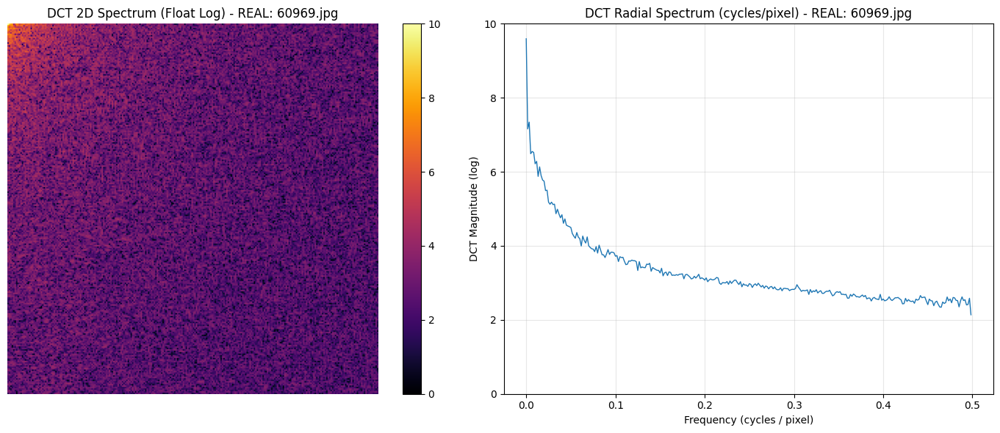

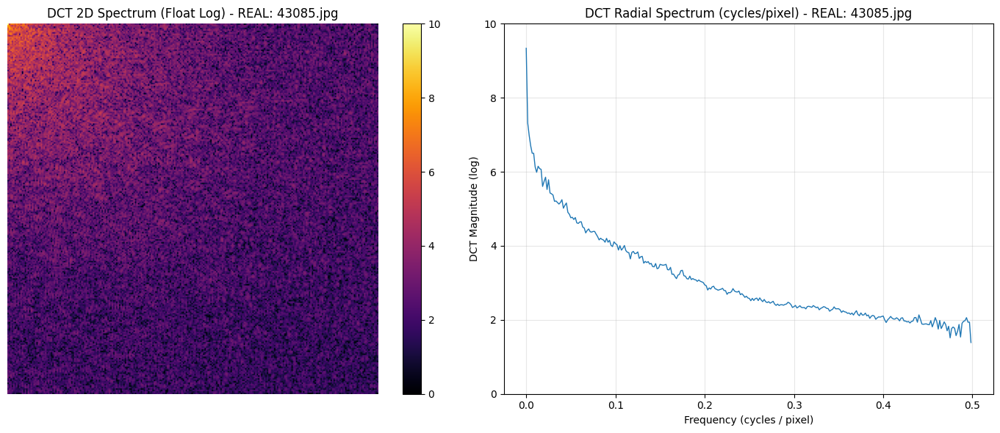

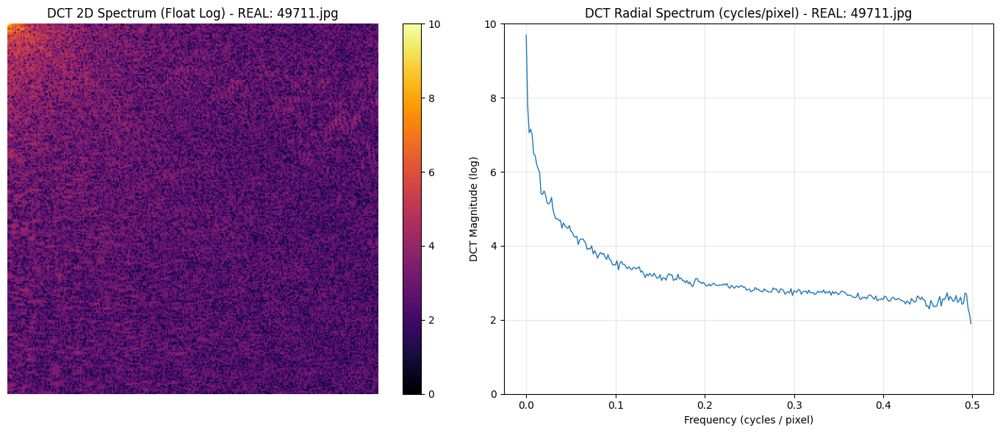


===== FAKE IMAGES DCT =====


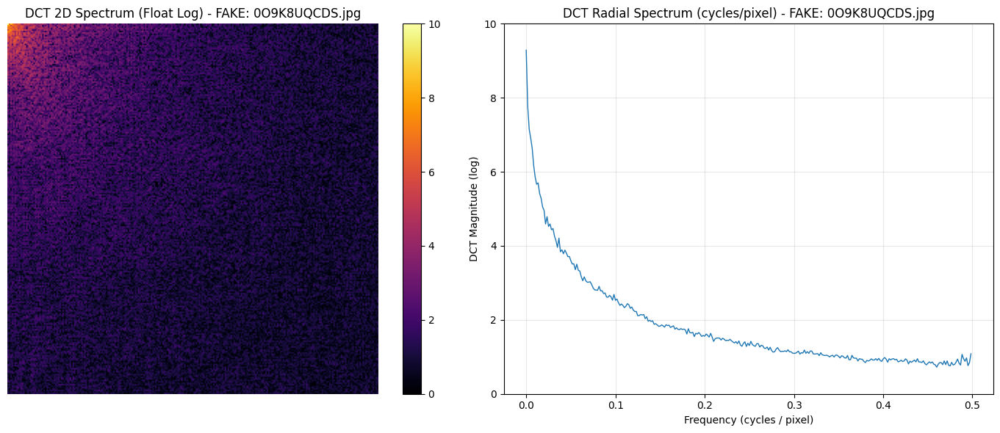

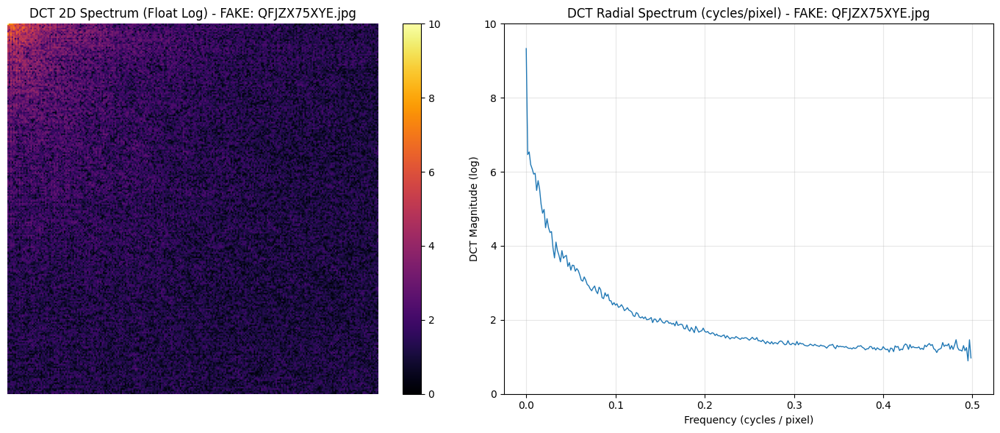

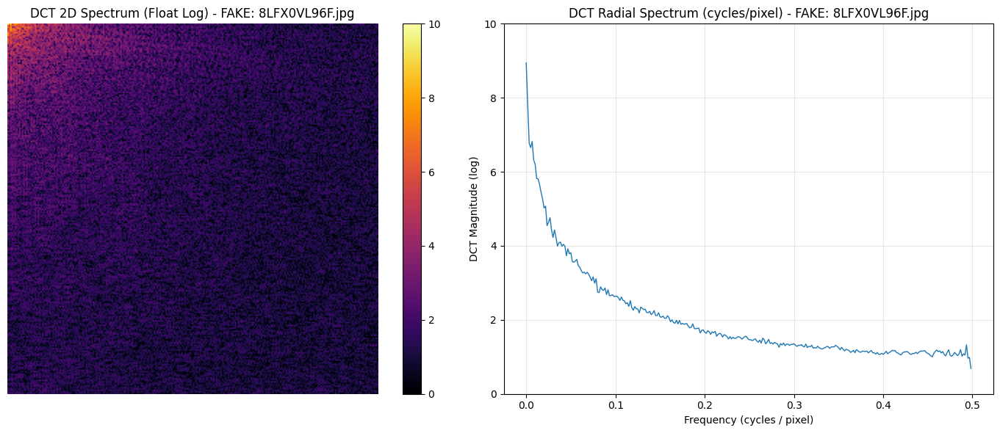

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# ================================
# 1. DCT 2D Spectrum (float heatmap)
# ================================
def dct_spectrum_2d(image, log_scale=True):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32)

    # 2D DCT (float)
    dct = cv2.dct(gray).astype(np.float32)
    mag = np.abs(dct)

    if log_scale:
        mag = np.log1p(mag)

    return mag  # FLOAT HEATMAP


# ================================
# 2. Radial DCT Spectrum (Real Frequency cycles/pixel)
# ================================
def dct_radial_real_frequency(image, num_bins=300):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY).astype(np.float32)

    dct = cv2.dct(gray)
    mag = np.abs(dct)

    H, W = mag.shape

    # Distance from top-left (DC component)
    Y, X = np.indices((H, W))
    r = np.sqrt(X**2 + Y**2)

    # Convert to real frequency 0 → 0.5 cycles/pixel
    r_norm = (r / r.max()) * 0.5

    bins = np.linspace(0, 0.5, num_bins + 1)
    radial = np.zeros(num_bins)

    for i in range(num_bins):
        mask = (r_norm >= bins[i]) & (r_norm < bins[i+1])
        if np.any(mask):
            radial[i] = np.mean(mag[mask])

    return bins[:-1], np.log1p(radial)


# ================================
# 3. Plot FLOAT HEATMAP + RADIAL
# ================================
def plot_dct_all(image_path, title):
    img = cv2.imread(image_path)
    if img is None:
        print("Error:", image_path)
        return

    heatmap = dct_spectrum_2d(img)
    freq_axis, signal = dct_radial_real_frequency(img)

    plt.figure(figsize=(14,6))

    # -------------------------
    # FLOAT HEATMAP
    # -------------------------
    plt.subplot(1,2,1)
    plt.imshow(heatmap, cmap='inferno', vmin=0, vmax=10)   # FIX SCALE 0→10
    plt.title(f"DCT 2D Spectrum (Float Log) - {title}")
    plt.colorbar()
    plt.axis("off")

    # -------------------------
    # RADIAL DCT (cycles/pixel)
    # -------------------------
    plt.subplot(1,2,2)
    plt.plot(freq_axis, signal, lw=1)
    plt.title(f"DCT Radial Spectrum (cycles/pixel) - {title}")
    plt.xlabel("Frequency (cycles / pixel)")
    plt.ylabel("DCT Magnitude (log)")
    plt.grid(alpha=0.3)
    plt.ylim(0, 10)   # FIXED Y-AXIS

    plt.tight_layout()
    plt.show()


# ================================
# 4. RUN FOR REAL + FAKE
# ================================
BASE = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train"

real_list = ["60969.jpg", "43085.jpg", "49711.jpg"]
fake_list = ["0O9K8UQCDS.jpg", "QFJZX75XYE.jpg", "8LFX0VL96F.jpg"]

print("\n===== REAL IMAGES DCT =====")
for fname in real_list:
    plot_dct_all(os.path.join(BASE, "real", fname), f"REAL: {fname}")

print("\n===== FAKE IMAGES DCT =====")
for fname in fake_list:
    plot_dct_all(os.path.join(BASE, "fake", fname), f"FAKE: {fname}")


In [9]:
# ----- GPU Info -----
try:
    gpu_info = subprocess.getoutput("nvidia-smi --query-gpu=name,memory.total --format=csv,noheader")
    if gpu_info:
        gpu_name, gpu_mem = gpu_info.split(", ")
        gpu_mem = gpu_mem.strip()
        gpu = f"{gpu_name} ({gpu_mem} VRAM)"
    else:
        gpu = "No GPU detected"
except:
    gpu = "No GPU detected"

# ----- CPU Info -----
try:
    cpu_model = subprocess.getoutput("lscpu | grep 'Model name'").split(":")[1].strip()
except:
    cpu_model = platform.processor()

# ----- RAM Info -----
ram_total_gb = round(psutil.virtual_memory().total / (1024**3))

# ----- OS Info -----
try:
    os_info = subprocess.getoutput("cat /etc/os-release | grep PRETTY_NAME")
    os_info = os_info.split("=")[1].replace('"', '').strip()
except:
    os_info = platform.platform()

# ----- IDE -----
ide = "Kaggle Notebook"

# ----- Create Table -----
data = {
    "Component": ["GPU", "CPU", "RAM", "OS", "IDE"],
    "Specification": [
        gpu,
        cpu_model,
        f"{ram_total_gb} GB",
        os_info,
        ide
    ]
}

df = pd.DataFrame(data)
df


,Component,Specification
0,GPU,Tesla P100-PCIE-16GB (16384 MiB VRAM)
1,CPU,Intel(R) Xeon(R) CPU @ 2.00GHz
2,RAM,31 GB
3,OS,Ubuntu 22.04.4 LTS
4,IDE,Kaggle Notebook


Train: 50000 50000
Valid: 10000 10000
Test: 10000 10000


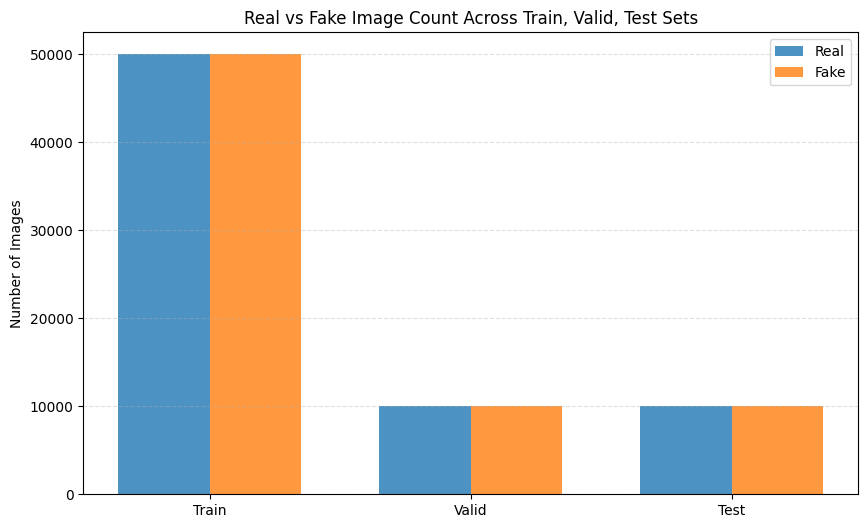

In [10]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

BASE_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake"

# ===============================
# Helper: count images in a folder
# ===============================
def count_images(path):
    real_dir = os.path.join(path, "real")
    fake_dir = os.path.join(path, "fake")

    real_count = len(os.listdir(real_dir)) if os.path.exists(real_dir) else 0
    fake_count = len(os.listdir(fake_dir)) if os.path.exists(fake_dir) else 0

    return real_count, fake_count

# ===============================
# Count all subsets
# ===============================
train_real, train_fake = count_images(os.path.join(BASE_PATH, "train"))
val_real,   val_fake   = count_images(os.path.join(BASE_PATH, "valid"))
test_real,  test_fake  = count_images(os.path.join(BASE_PATH, "test"))

print("Train:", train_real, train_fake)
print("Valid:", val_real, val_fake)
print("Test:",  test_real,  test_fake)

# ===============================
# Prepare Data for Chart
# ===============================
subsets = ["Train", "Valid", "Test"]
real_counts = [train_real, val_real, test_real]
fake_counts = [train_fake, val_fake, test_fake]

x = range(len(subsets))

# ===============================
# Plot
# ===============================
plt.figure(figsize=(10, 6))
bar_width = 0.35

plt.bar([i - bar_width/2 for i in x], real_counts, width=bar_width, label="Real", alpha=0.8)
plt.bar([i + bar_width/2 for i in x], fake_counts, width=bar_width, label="Fake", alpha=0.8)

plt.xticks(x, subsets)
plt.ylabel("Number of Images")
plt.title("Real vs Fake Image Count Across Train, Valid, Test Sets")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)

plt.show()


In [11]:
def load_image(path):
    img = cv2.imread(path)
    if img is None:
        return None
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


def get_image_paths(base, subset):
    real_dir = os.path.join(base, subset, "real")
    fake_dir = os.path.join(base, subset, "fake")

    real_paths = [os.path.join(real_dir, f) for f in os.listdir(real_dir)]
    fake_paths = [os.path.join(fake_dir, f) for f in os.listdir(fake_dir)]

    return real_paths, fake_paths


BASE_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake"
TRAIN_REAL, TRAIN_FAKE = get_image_paths(BASE_PATH, "train")
VAL_REAL, VAL_FAKE     = get_image_paths(BASE_PATH, "valid")
TEST_REAL, TEST_FAKE   = get_image_paths(BASE_PATH, "test")


=== BASIC STATISTICS ===


Computing statistics: 100%|██████████| 50000/50000 [10:05<00:00, 82.55it/s]


            mean        std  brightness   contrast
Real  112.907210  62.757374  114.606421  58.084676
Fake  112.705812  61.316867  114.415371  56.738981


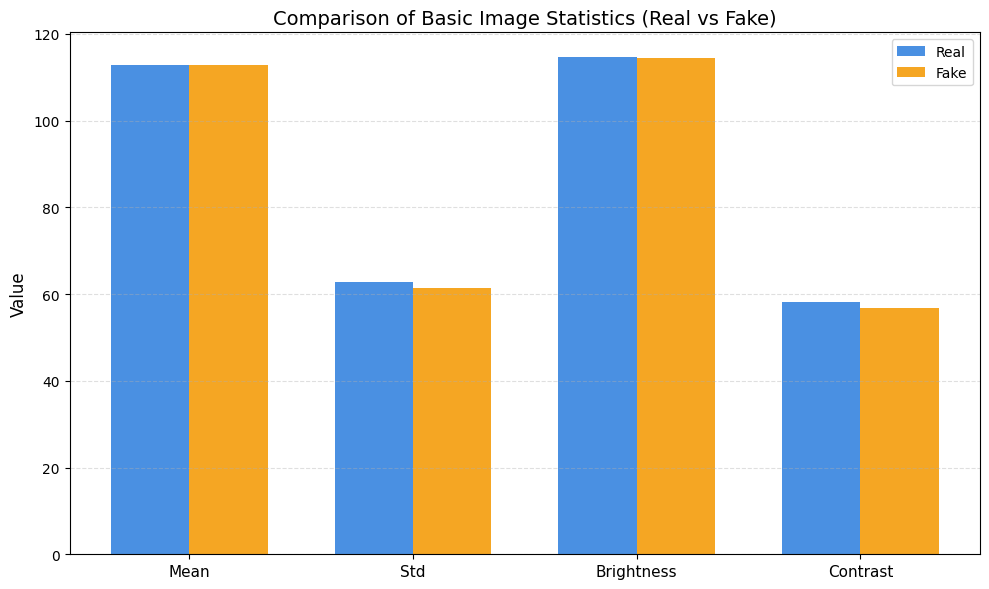

In [12]:
# COMPUTE BASIC IMAGE STATISTICS (MEAN, STD, BRIGHTNESS, CONTRAST)

def compute_statistics(image_paths):
    means = []
    stds = []
    brightness_vals = []
    contrast_vals = []

    for p in tqdm(image_paths, desc="Computing statistics"):
        img = load_image(p)
        if img is None:
            continue

        img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        means.append(np.mean(img))
        stds.append(np.std(img))

        brightness_vals.append(np.mean(img_gray))
        contrast_vals.append(np.std(img_gray))

    return {
        "mean": np.mean(means),
        "std": np.mean(stds),
        "brightness": np.mean(brightness_vals),
        "contrast": np.mean(contrast_vals),
    }


print("\n=== BASIC STATISTICS ===")

stats_real = compute_statistics(TRAIN_REAL)
stats_fake = compute_statistics(TRAIN_FAKE)

df_stats = pd.DataFrame([stats_real, stats_fake], index=["Real", "Fake"])
print(df_stats)

import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ["Mean", "Std", "Brightness", "Contrast"]

real_values = [112.907210, 62.757374, 114.606421, 58.084676]
fake_values = [112.705812, 61.316867, 114.415371, 56.738981]

x = np.arange(len(categories))
width = 0.35  # bar width

plt.figure(figsize=(10, 6))

# Bars
plt.bar(x - width/2, real_values, width, label='Real', color="#4A90E2")
plt.bar(x + width/2, fake_values, width, label='Fake', color="#F5A623")

# Labels & formatting
plt.xticks(x, categories, fontsize=11)
plt.ylabel("Value", fontsize=12)
plt.title("Comparison of Basic Image Statistics (Real vs Fake)", fontsize=14)
plt.legend()

plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()



=== COLOR CHANNEL MEANS ===


Checking RGB channels: 100%|██████████| 50000/50000 [02:28<00:00, 337.20it/s]


          R_mean      G_mean     B_mean
Real  132.947423  108.649982  97.124225
Fake  132.634699  108.514755  96.967981


<Figure size 800x500 with 0 Axes>

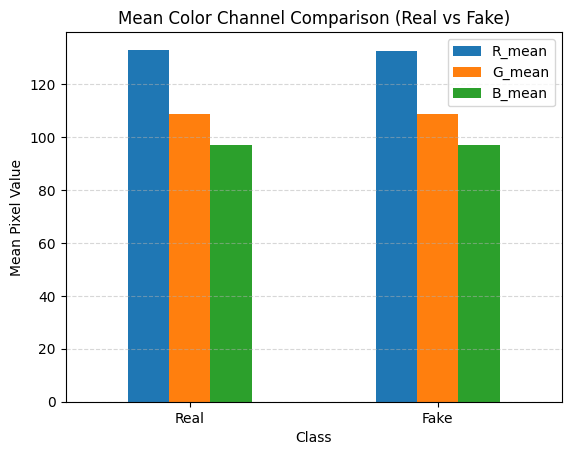

In [13]:
# COLOR CHANNEL IMBALANCE (Mean R, G, B)

def compute_rgb_means(image_paths):
    R_vals, G_vals, B_vals = [], [], []

    for p in tqdm(image_paths, desc="Checking RGB channels"):
        img = load_image(p)
        if img is None:
            continue

        R_vals.append(np.mean(img[:, :, 0]))
        G_vals.append(np.mean(img[:, :, 1]))
        B_vals.append(np.mean(img[:, :, 2]))

    return {
        "R_mean": np.mean(R_vals),
        "G_mean": np.mean(G_vals),
        "B_mean": np.mean(B_vals)
    }


print("\n=== COLOR CHANNEL MEANS ===")

rgb_real = compute_rgb_means(TRAIN_REAL)
rgb_fake = compute_rgb_means(TRAIN_FAKE)

df_rgb = pd.DataFrame([rgb_real, rgb_fake], index=["Real", "Fake"])
print(df_rgb)


# ============================================================
# PLOT RGB COMPARISON
# ============================================================

plt.figure(figsize=(8,5))
df_rgb.plot(kind="bar")
plt.title("Mean Color Channel Comparison (Real vs Fake)")
plt.xlabel("Class")
plt.ylabel("Mean Pixel Value")
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.show()